# Introduction to the Linux Command Line

This lecture will introduce you to the Linux command line. We will interchangebly call it "the terminal," "bash," "shell" or even just "Linux." 

Although most of you have likely to have never used the command line, a few decades ago, the terminal was the only method of communicating with your computer. There were no windows, no graphics, no pointer deviecs, only a keyboard and a screen displaying a small range of characters in 80 columns.

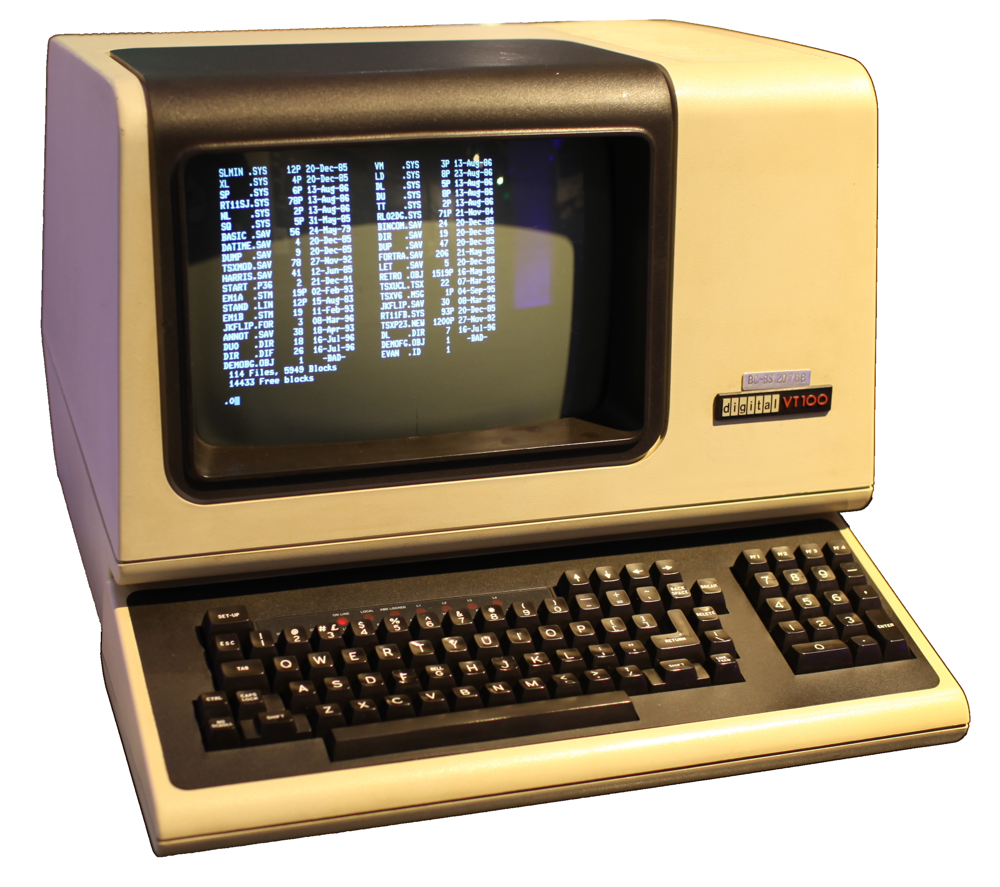


Source: By Gorthmog - This image has been extracted from another file, CC BY-SA 4.0, https://commons.wikimedia.org/w/index.php?curid=78497051

Despite looking ancient, there are some benefits to being familiar with the terminal. I have personally been told that my use of the terminal was "like magic," because of how fast I was able to accomplish some data manipulation tasks.

In these notes, you will leanr this magic.

## How do you access the terminal?

In this class, we will connect to a remote Linux machine and use the terminal properly. However, there are other ways you can practice this craft.

### Windows
Windows has its own command line tools. They are called the "command prompt" and "power shell." 

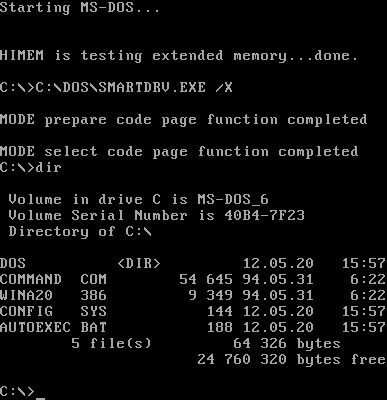  
By Gorthmog - This image has been extracted from another file, CC BY-SA 4.0, https://commons.wikimedia.org/w/index.php?curid=78497051

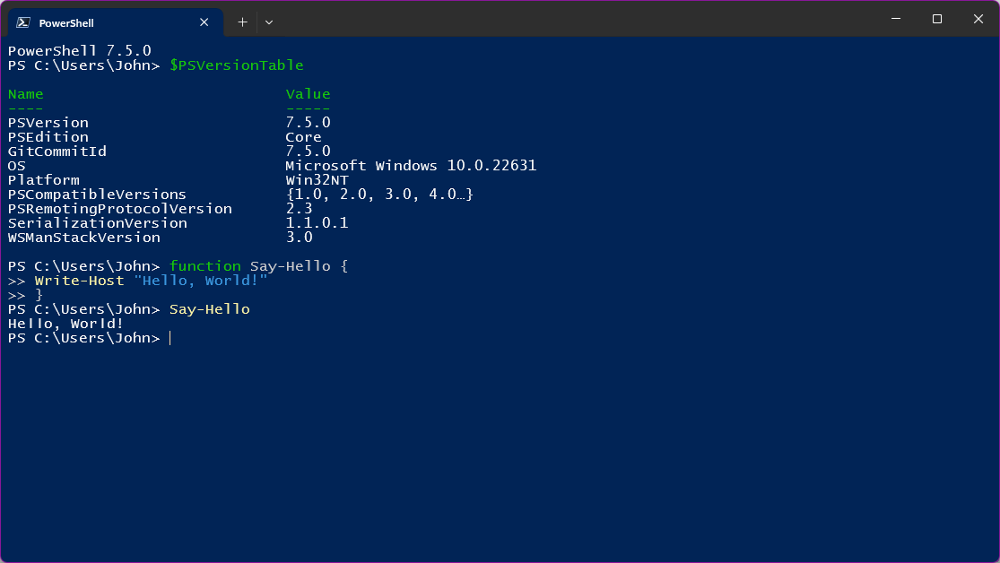  
By Refresh100 - Own work, MIT, https://commons.wikimedia.org/w/index.php?curid=163362204

Despite the screenshots above, we will not use these tools. Windows command prompts use different syntax from standard Linux terminals. 

However! Modern windows does provide a tool called "WSL" or "Windows Subsystem for Linux." Microsoft has embedded a small copy of Linux right within Windows. The following instructions show you how to install WSL: https://learn.microsoft.com/en-us/windows/wsl/install

Generally, you can just press the "Start" button and type in "wsl". Clicking on the penguin icon may be all you need to access Linux on windows.

### Mac
Lucky for Mac users, the Mac terminal is very similar to the Linux terminal. For the purpose of this lecture, they are almost identical. You can open the terminal by pressing "command + space" and typing the word "terminal".

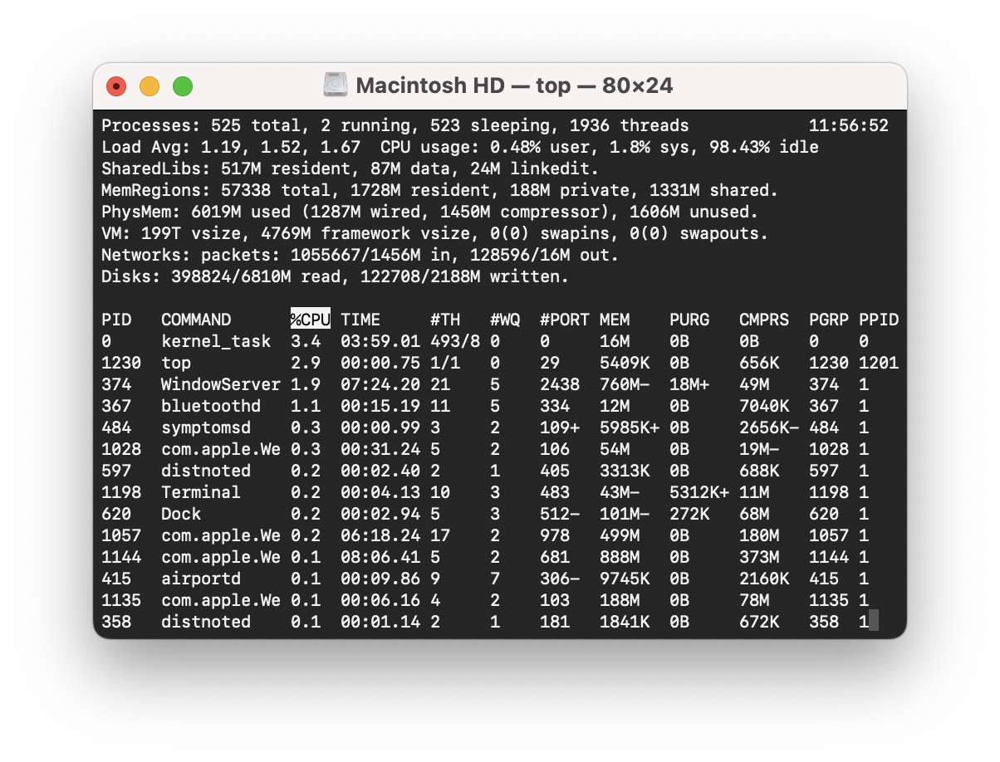
By StreetcarEnjoyer - Own work, CC0, https://commons.wikimedia.org/w/index.php?curid=143021644

### Virtual machines (multipass)
A good option is to install a virutal copy of Linux on your computer (Windows or Mac ... or even Linux). If video games can simulate cities, planets and galaxies on your computer, can't they simulate other computers? That's a virtual machine or a VM.

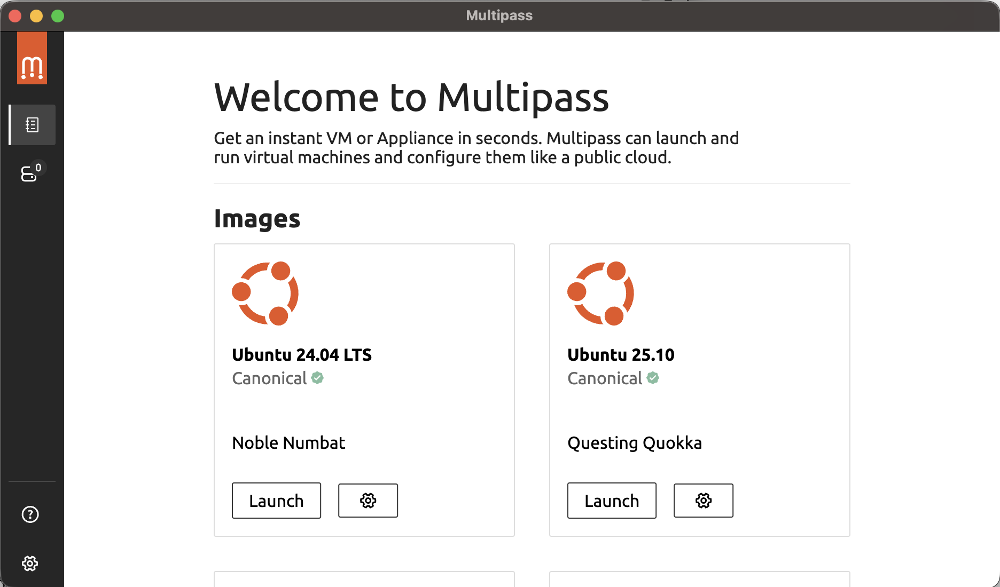


### A real Linux machine
In this class, we will connect to a remote Linux machine. The "IP" address of the machine will be provided to you in class. 

## But why?

### Remote servers don't have graphics (or a mouse)
In this class, we will be deploying our code to servers. Our laptops are built for interactive work. We multi-task with many visual windows, use the mouse to navigate the destop, use a game controller to play games, use the mic and the video camera to participate in conferences. Servers serve a different purpose.

Servers sit in data centers, connected by cables to other servers. They run software which may run for days, if not years, responding to incoming requests and going about their business without constant input from human operators.

While the rest of the industry moved on from ancient, text based terminals to "Graphical User Interfaces," the server enviornment had no need for them. The text based terminal provides the perfect interface to remote computers: just enough fidelity to deploy your code, no unnecessary compute or electricty spent on drawing windows or managing the mouse. 

In this enviornment, we have no choice but to use the computer via a text based interface.

### The terminal can be _more_ productive (for some tasks)
As we will see in the _pipe_ section, some tasks can actually be done faster. That point remains to be argued. 

## Log on to the remote machine

Once you have an IP address (think of it as a telephone number for computers on the internet), you will open your laptop's terminal or command line (Windows or Mac, doesn't matter) and use the `ssh` tool as such:

**WARNING** Be prepared with a new password

```bash
ssh username@remotemachine
```

Your will be given a username and a one-time-only password. The first time you log on, the password will expire and you will have to create a new one.

This is what the session will look like:
```bash
~$ ssh studentname@mleng
The authenticity of host 'remotemachine (192.26.23.24)' cant be established.
ED25519 key fingerprint is SHA256:g2nTlYf9WDz...l0M4VrJSigaw.
This key is not known by any other names.
Are you sure you want to continue connecting (yes/no/[fingerprint])?
```

Although the above message looks like an error, it is perfectly normal. It is asking if you trust the remote machine. Type `yes` to continue.

**WARNING** As you type passwords, it will look like nothing is happening. Linux will not show you the letters you are typing. It will _not even show you `*` characters_.

```bash
Warning: Permanently added 'remotemachine' (ED25519) to the list of known hosts.
studentname@mlengs password:  <== You will not see any indication that you are typing your password
```

If your login attempt was not successful, you will get an error. If you did log in correctly, you see a prompt, something like the following:

```bash
studentname@mleng:~$
```

The `~` character is telling you that you are in your home directory (more details below). The `$` is just a prompt character. The whole prompt is cusotmizable so the details may differ.

## A quick word about file systems
Modern operating systems have heirarchical filesystems - a set of directories (aka folders). This is the location where your files and programs are placed. 

### Windows file system looks something like this:

```
c:\
    ...
    Program Files
    Program Files (x86)
    Windows
    Users
        Public
        shahbaz         <==== Home directory
            Desktop
            Documents
            Pictures
            .gitconfig
            ...
```

### Mac users' file system looks something like this

```
/
    ...
    tmp/
    Applications/
    Library/
    Users/
        shahbaz/           <==== Home directory
            Applications/
            Desktop/
            Downloads/
            ...
```

### Linux users' file system looks something like this

```
/
    ...
    tmp/
    bin/
    opt/
    home/
        shahbaz/   <==== Home directory
```

When you start a terminal, you are generally placed in your home directory. At all times, you are in a specific directory (a concept which will be foreign to users of visual user interfaces). You _move_ in the file system by going _into_ sub-directories or going _up_ to _parent_ directories.

## Basic navigation

First, let's orient ourselves.

#### **`pwd`** or "present working directory" tells you where you are 

The **`pwd`** command tells you your current location (aka your current directory). If you just started the terminal or sshd into a machine, your are likely to be in `/home/your_user_id`.
```bash
(base) shahbaz@mleng:~$ pwd
/home/shahbaz
```

#### **`ls`** or "list" show you the contents of a directory
The **`ls`** command is perhaps the most used command. It lists the contents of the current directory. You likely don't have anything in your directory so the `ls` command won't show you anything. Let's look under a different direcotry. Let's go to the top of our heirarchical file system and see what is in the root directory `/` by typing `ls /`:
```bash
(base) shahbaz@mleng:~$ ls /
bin                cdrom  home   lib.usr-is-merged  mnt   root  sbin.usr-is-merged  sys  var
bin.usr-is-merged  dev    lib    lost+found         opt   run   snap                tmp
boot               etc    lib64  media              proc  sbin  srv                 usr
```

Ok, lots of gibberish looking things! Most of those a system directories - we will never use them.

Let's create a few empty files using the `touch` command. This is not a very common command, but we use it here because we haven't learned anything else yet:
```bash
touch newfile1.txt
touch newfile2.txt
```

Let's see if those files actually show up:
```bash
(base) shahbaz@mleng:~$ touch newfile1.txt
(base) shahbaz@mleng:~$ touch newfile2.txt
(base) shahbaz@mleng:~$ ls
newfile1.txt  newfile2.txt <== Here they are!
```

Let's see some more detail, when were they created, how much space are they using, etc.:
```bash
(base) shahbaz@mleng:~$ ls -l
total 12
-rw-rw-r-- 1 shahbaz shahbaz    0 Jan  8 05:53 newfile1.txt
-rw-rw-r-- 1 shahbaz shahbaz    0 Jan  8 05:53 newfile2.txt
```

The `-l` option shows files in list listing format. This format shows us file permissions (r-read, w-write), file ownership, disk usage (0, they are empty!), time stamp of when they were modified and file names. 

#### Aside: **`man`** or "manual" is your online manual
A _very_ useful tool is the **`man`** command, referring to Linux's built-in manuals. Try this for detailed documentation on the `ls` command: `man ls`.

Sometimes an easier to digest way to get help is to use the **`--help`** command. Most Linux commands have this available. Try it on the ls command: `ls --help`

#### **`mkdir`** or "make directory" creates a new directory or a folder
Let's create a new directory using the **`mkdir`** command:
```bash
(base) shahbaz@mleng:~$ mkdir test
(base) shahbaz@mleng:~$ ls -l
total 12
-rw-rw-r-- 1 shahbaz shahbaz    0 Jan  8 05:53 newfile1.txt
-rw-rw-r-- 1 shahbaz shahbaz    0 Jan  8 05:53 newfile2.txt
drwxrwxr-x 2 shahbaz shahbaz 4096 Jan  8 05:58 test <== New directory exists!
```

Notice the first character in the line containing the new directory: `drwxrwxr`, the letter `d` stands for directory!

#### **`cd`** or "change directory" moves you into or out of directories
Now lets go into the `test` directorying using the **`cd`** command, and create two additional files:
```bash
(base) shahbaz@mleng:~$ cd test
(base) shahbaz@mleng:~/test$ ls -l 
(base) shahbaz@mleng:~/test$ touch newfile3.txt
(base) shahbaz@mleng:~/test$ ls -l 
total 0
-rw-rw-r-- 1 shahbaz shahbaz 0 Jan  8 06:07 newfile3.txt 
```

Notice how the first `ls` command returns no results. We just created this directory, it is empty! After we create `newfile3.txt`, the `ls` command does indeed show the new file.

A couple of things to notice, we navigated to the test directory by issuing the command `cd test`. Once inside the directory, did you notice that the command prompt change?
```bash
(base) shahbaz@mleng:~$ cd test
(base) shahbaz@mleng:~/test$  
                      ^^^^^<----------this is telling us our current location!
```
Specifically, `~/test` tells us that we are in a directory called `test`, under the home directory `~`. Yes, that strange tilde character refers to the home directory.

If you want to leave the `test` directory and go back up to the home directory, you can issue the `cd ..` command. The two dots `..` mean go up one level. If you wanted to go up two levels, you would issue the command `cd ../..` and so on. If `..` means the parent directory, `.` means the current directory. `cd .` will keep you in the current directory. The single dot `.` does become useful in some instances.

Let's go a bit beyond or home directory. Let's check out the `/tmp` directory by issuing `cd /tmp`. Notice we didn't say `cd tmp`. That would have meant, take me to a sub-directory called `tmp`, but we haven't created any such directory. By placing a slash at the beginning, we are saying, go to the root `/`, and from there, go to the `tmp` directory. Hence, `cd /tmp`.


### Summary:
  - `man command` - Help on any _command_
  - `pwd` – Print working directory
  - `ls`  – List files and directories
    - `directory`  – List file in _directory_
    - `.`  – List file in current directory
    - `..` – List file in parent directory
    - `~`  – List file in home directory
  - `cd directory`  – Change to _directory_
    - `cd .`  – Current directory
    - `cd ..` – Parent directory
    - `cd ~`  – Home directory
    - `cd -`  - Previous directory
  - `mkdir directory`  – Create _directory_

## Working with files

In this section, we will work with files. If you haven't done so, let's create a `test` directory and put some files in there:

```bash
mkdir test
touch test/newfile3.txt
```

Let's make sure the file was created correctly:
```bash
ls test
```

You should see file `newfile3.txt` when you list files in the `test` directory. Let's also make sure the file doesn't exist in the current directory:
```bash
ls
```

You may see several files, you should certainly see the `test` directory, but you should not see `newfile3.txt`.

#### **`cp`** or "copy" copies files from soure to destination
The **`cp source target`** will copy files from _source_ location to _target_ location. Let's copy `newfile3.txt` from `test` up to the current directory:
```bash
cp test/newfile3.txt .
```
In the command above, we are copying file `test/newfile3.txt` to _current_ directory, by using the `.` character. Recall that `.` means "current" directory.

We confirm that the file was copied _and_ that it is also in the original location
```bash
ls
ls test
```

#### **`rm`** or "remove" removes or deletes files and directories
The **`rm file`** command will remove or delete files. Let's remove the file we just copied:
```bash
rm newfile3.txt
```

Confirm that it no longer exists.

#### **`mv`** or "move" can be used to move files from source to target or rename file names
We can _move_ files (not copy) by using the **`mv source target`** command. Remember that to "copy" a file means leaving the original file in the oriignal locaiton, but creating a copy in the target location. To "move" file file means the file should be in the new location, but _no longer_ in the old location. 

Since we deleted `newfile3.txt`, let's move it from `test` up to the current directory, then confirm that the file was indeed moved:
```bash
mv test/newfile3.txt .
ls
ls test
```

The `mv` command can also be used to _rename_ a file. Just move it from the old name to a new name:
```bash
mv newfile3.txt newfile4.txt
```

#### Combine `ssh` and `cp` into **`scp`** to copy files between machines
In the next section, we will work with files and their content. Let's upload a file to the remote server. Recall that we connected to that server via ssh. 

We will work with a file already avialable in our lecture notes at the following location:

`~/Documents/GitHub/lectures/datasets/deaths-in-gameofthrones/game-of-thrones-deaths-data.csv`

Please note that The contents of class lectures were downloaded (or git cloned) to my machine at `~/Documents/GitHub`. On your machine, they may be at a different location. 

Let's first copy the file `game-of-thrones-deaths-data.csv` to the current location (and confirm the `ls` that it was correctly copied:
```bash
cp ~/Documents/GitHub/lectures/datasets/deaths-in-gameofthrones/game-of-thrones-deaths-data.csv .
```

We will now "upload" this file to our remote machine.

The **`scp source target`** command, also known as "secure copy" combines ssh and `cp`. It allows us to copy files between remote machines. Let's use this command:
```bash
scp game-of-thrones-deaths-data.csv username@remote_ip:target/location
```
Notice that in target argument, you have to provide your user name, IP or host of the remote machine, a `:` and the path of the remote directory. Quite a lot done with a simple command!

Note that there are various visual tools available for such file management as well.

### Extract information from files

#### **`head`** or **`tail`** will display the first or last few lines of a file
Use the **`head filename`** command to view the first few lines of the file we just uploaded.

First, the name `game-of-thrones-deaths-data.csv` is far too long to type our, character by character. Professionals (almost) _never_ type out full names. They use a very useful feature of linux comnand line, called **tab completion**.

Let's use the `head` command, but we are only going to type a few characters of the file name, then press the _`tab`_ button to get linux to complete the file name for us:
```bash
head ga[tab][tab]
```

Among computer experts, _laziness is a virtue_. Let the computer do as much as possible. 

Similar to the `head` command, the **`tail filename`** command will show you the last few lines. Do you think there is a way to control the number of displayed lines? (hint: `man` and `  --help`)

#### **`less`** (a modern alternative to the **`more`** command) will let you scroll through a file interactively
The **`less filename`** is used to open a large file and scroll through it. This command is a modern version of an older command called `more filename`. However, `less` is _more_ featureful.

#### **`cat`** or "concatenate" will display the _full_ contents of the file
A more common command is **`cat filename`**. However, _be very careful_ with this command. If you have a very large file, the `cat` command will display ALL OF IT. To view a remove file is the same as downloading it (in a less effecient manner). 

**Aside**: If you do accidentally execute the `cat` command on a large file, you can cancel it (or any other command) using the key combination **`ctrl + c`**, this means you hold down the `control` key on your keyboard while pressing `c` (for cancel). 

#### **`wc`** or "word count" will help you count the number of characters, words or lines in a file
The **`wc -l filename`** command counts the number of lines in a file. Let's count the number of lines in the file:
```bash
wc -l game-of-thrones-deaths-data.csv
```
Remember, you should NOT be typing the full file name. BE LAZY: you should actually type `wc -l ga[tab]`

#### **`uniq`** or "unique" will remove consecutive lines which are identical
The **`uniq filename`** command shows the text file, while supressing duplicate repeated lines. To remove duplicate lines which are spread across a file, we will combine `uniq` and `sort` in a later section. `uniq -c` removes duplicates, but also counts the number of times a duplicate line showed up.

The following will create a test fiel containing some duplicates (we will learn about `echo` and `>>` later as well):
```bash
echo hello >> hello.txt
echo hello >> hello.txt
echo hi >> hello.txt
echo hello >> hello.txt
```
Let's remove some duplicates:
```bash
cat hello.txt
uniq hello.txt
uniq -c hello.txt
```
Notice that the `uniq` command removes one of the two "hello"s next to each other. The `uniq -c` command counts the number of consecutive duplicates. 

#### **`sort`** will simply sort a file
The **`sort filename`** command will sort a file - self explanatory. You may have noticed that the game of thrones file is already sorted by order, season, episode, etc.
```bash
sort game-of-thrones-deaths-data.csv
```

The result looks odd:
```bash
996,6,9,Stark soldier,Bolton soldier,Sword,Blade,Killed during the Battle of the Bastards,Winterfell,House Stark,1
997,6,9,Stark soldier,Bolton soldier,Spear,Polearm,Killed during the Battle of the Bastards,Winterfell,House Stark,1
998,6,9,Stark soldier,Bolton soldier,Spear,Polearm,Killed during the Battle of the Bastards,Winterfell,House Stark,1
999,6,9,Stark soldier,Jon Umber,Sword,Blade,Killed during the Battle of the Bastards,Winterfell,House Stark,1
order,season,episode,character_killed,killer,method,method_cat,reason,location,allegiance,importance
```

The file is being sorted in alphabetical order!

**Aside** Wildcards or `*` allow you to match many files with partial names
Say you have a directory with many files
```bash
(base) shahbaz@mleng:~$ ls
game-of-thrones-deaths-data.csv  newfile1.txt  student_accounts.yml
hello.txt                        newfile2.txt  students.txt
id_rsa.pub                       newfile3.txt  test
```
You can select just the `.txt` files by issuing the command `ls *.txt`, meaning, "only show me files that end with ".txt":
```bash
(base) shahbaz@mleng:~$ ls *.txt
hello.txt  newfile1.txt  newfile2.txt  newfile3.txt  students.txt
```

Similarly, you could search for files that begin with the word "new" via `ls new*`:
```bash
(base) shahbaz@mleng:~$ ls new*
newfile1.txt  newfile2.txt  newfile3.txt
```

You can use wildcards anywhere on linux command, with any command that accepts filenames. For example, let's copy all "new*.txt" files to the test folder:
```bash
(base) shahbaz@mleng:~$ ls test
(base) shahbaz@mleng:~$ cp new* test
(base) shahbaz@mleng:~$ ls test
newfile1.txt  newfile2.txt  newfile3.txt
```

### Summary:
  - `cp source target` - copy path and/or filename _source_ to path and/or filename _target_
  - `scp [remote_machine]:source [remote_machine]:target` - upload/download path and/or filename _source_ to path and/or filename _target_
  - `mv source target` - move path and/or filename _source_ to path and/or filename _target_
  - `head filename`  – show the first few lines of a text file
  - `tail filename`  – show the last few lines of a text file
  - `less filename` - Interactively inspct a text file
  - `cat filename` - display full contents of a file
  - `wc -l filename` - Count the number of lines in a text file
  - `sort filename` - sort a file (alphabetically)
    - `sort -n`  – sort numerically
    - `sort -r`  – sort in reverse order
  - `uniq filename` - remove redundant lines
    - `uniq -c`  – remove redundant lines and count their frequency
  - `*` wildcards are very helpful when working with multiple files


In [2]:
# TODO: sort does not seem to be sorting numercally (mac only?)

- wildcards
- confirm scp command syntax
- ssh + any command - execute any commnad on the remote machine
- sort does not seem to be sorting numerically!!
-   - sort -n and sort -r

#### **`>`** / **`>>`** or "redirection" will let you write the output of your stream to a file

For example, `cat hello.txt|wc -l` tells us the number of lines in hello.txt:
```bash
(base) shahbaz@mleng:~$ cat hello.txt |wc -l
7
```
You can write this to a file via `cat hello.txt|wc -l > num_lines.txt`
```bash
(base) shahbaz@mleng:~$ cat hello.txt |wc -l > num_lines.txt
(base) shahbaz@mleng:~$ cat num_lines.txt 
7
```
No matter how many times you run this command, the value in the file will always be "7". In other words, `>` will blow away the old file and create a new one, with the output of your command. 
```bash
(base) shahbaz@mleng:~$ cat hello.txt |wc -l > num_lines.txt
(base) shahbaz@mleng:~$ cat hello.txt |wc -l > num_lines.txt
(base) shahbaz@mleng:~$ cat hello.txt |wc -l > num_lines.txt
(base) shahbaz@mleng:~$ cat hello.txt |wc -l > num_lines.txt
(base) shahbaz@mleng:~$ cat num_lines.txt 
7
```

If you want to _append_ to the file, you use double arrows or `>>`:
```bash
(base) shahbaz@mleng:~$ cat hello.txt |wc -l >> num_lines.txt
(base) shahbaz@mleng:~$ cat hello.txt |wc -l >> num_lines.txt
(base) shahbaz@mleng:~$ cat hello.txt |wc -l >> num_lines.txt
(base) shahbaz@mleng:~$ cat hello.txt |wc -l >> num_lines.txt
(base) shahbaz@mleng:~$ cat num_lines.txt 
7
7
7
7
7
```

## The **`|`** character is (almost) magical
The pipe command `|` is perhaps one of the most useful features of the command line. Much like a real "pipe," it connects outputs of one command to input of another. 

Remember the `wc -l` command from earlier. You can certainly use it as `wc -l filename`. Just as often, you can feed it input text via the pipe:
```bash
cat hello.txt|wc -l
```

Why would you execute a command backwards, like this? Because you can chain multiple commands together:
```bash
cat hello.txt|sort|uniq -c|sort -n
```

The `cat hello.txt` will output the contents of the file. `|sort` will take the output of `cat` and feed it to the sort function. The sorted output will have its redundant lines removed and the final `sort` command will numerically sort the lines with the largest frequency. All this, in a single line!

## Transform files

#### **`nano`** is a very simple text editor that you can use over ssh
When working on a remote server, you can use **`nano filename`** to edit files. Professionals often use another tool called **`vi`**; however, `nano` is _much_ more user friendly.
`nano` will conveniently show useful commands at the bottom of the screen:
```bash
  UW PICO 5.09                             New Buffer                                



^G Get Help   ^O WriteOut   ^R Read File  ^Y Prev Pg    ^K Cut Text   ^C Cur Pos    
^X Exit       ^J Justify    ^W Where is   ^V Next Pg    ^U UnCut Text ^T To Spell 
```

Note that `^X` means hold down the "control" key and press the letter "X".

#### **`tr`** or "translate characters" is a very fast way to replace, delete or suppress characters
More often, you will need to edit file via commands which operate on stream. For example, the **`tr option`** command is extremely fast and provides useful operations on individual characters.

Here are some examples.
This will replace each letter 'l' with 'X':
```bash
cat hello.txt | tr l X 
```
This will replace remove duplicate letters 'l' in a single line (reminder that `uniq` removes duplicate lines):
```bash
cat hello.txt | tr -s l 
```
This will simply delete all instances of the letter 'l':
```bash
cat hello.txt | tr -d l
```
This will delete all letters between the letters "h" and "l":
```bash
cat hello.txt | tr -d "[h-l]"
```

#### **`sed`** or "stream editor" is a common way to replace a bunch of letters with another set of letters
The **`sed script filename`** command is quite complex, but is most often used to replace a piece of text with another:
```bash
cat hello.txt|sed "s/hell/heck/g"
```
The prefix `s/` tells send that we are looking to replace one expression with another. Once you use this command a few times, you will just memorize it. the `/g` part tells `sed` to perform this transformation globally (throughout the line, not just once). Note that you can use regular expression expressions in this command as well.

#### **`cut`** command will allow you to retrieve a single column from a delimited file
If you haven't already done so, move a csv file into the current directory for experiments
```bash
cp ~/Documents/GitHub/lectures/datasets/deaths-in-gameofthrones/game-of-thrones-deaths-data.csv .
```

To remind ourselves of what it looks like, let's take a peek at its contents
```bash
head game-of-thrones-deaths-data.csv
```
Which results in:
```csv
order,season,episode,character_killed,killer,method,method_cat,reason,location,allegiance,importance
1,1,1,Waymar Royce,White Walker,Ice sword,Blade,Unknown,Beyond the Wall,"House Royce, Night’s Watch",2
2,1,1,Gared,White Walker,Ice sword,Blade,Unknown,Beyond the Wall,Night’s Watch,2
3,1,1,Will,Ned Stark,Sword (Ice),Blade,Deserting the Night’s Watch,Winterfell,Night’s Watch,2
4,1,1,Stag,Direwolf,Direwolf teeth,Animal,Unknown,Winterfell,None,1
5,1,1,Direwolf,Stag,Antler,Animal,Unknown,Winterfell,None,1
6,1,1,Jon Arryn,Lysa Arryn,Poison,Poison,Petyr Baelish persuaded Lysa to do so for reasons unknown,King’s Landing,House Arryn,2
7,1,1,Dothraki man,Dothraki man,Arakh,Blade,A Dothraki wedding without at least three deaths is a dull affair,Pentos,Dothraki,1
8,1,2,Catspaw assassin,Summer,Direwolf teeth,Animal,Attempting to kill Bran Stark,Winterfell,None,1
9,1,2,Mycah,Sandor “the Hound” Clegane,Unknown (likely a sword),Unknown,Joffrey has him killed after Arya attacks Joffrey,Kingsroad,Smallfolk,3
```

We can see that this file is "comma" delimited, hence the ending `.csv` (or comma separated values). We can retrieve the fourth column, `character_killed` by cutting our the 4th column, but we have to tell the command that the file is indeed `,` delimited:
```bash
head game-of-thrones-deaths-data.csv | cut -d, -f3
```
Which results in:
```bash
character_killed
Waymar Royce
Gared
Will
Stag
Direwolf
Jon Arryn
Dothraki man
Catspaw assassin
Mycah
```

**Note** This can be a very powerful command for data scientists, who work with csv files more often than software engineers.

### Summary:
  - `tr <char a> <char b>` - character level _translate_ command, replace character `a` with character `b`
    - `tr -s <char a>`  – remove redundant characters: "aaa" becomes "a"
    - `tr -d <char a>`  - delete specific characters: "abra cadabra" becomes "br cdbr"
  - 
  - `sed "s/<pattern>/replacement/g"` - used when more than a single character needs to be replace: `sed "s/hello/hiya/g"`
  - `cut -d, -f1,2,3` - used to extract columns from csvs
  - `>` - redirect the output of a command to a file (overwrite if the file already exists)
  - `>>` - redirect the output of a commmand to a file (append if the file already exists)
  - `|` - "pipe" operator, which passes the output of a commad to input of another

## Search for information

#### **`grep`** is a weirdly named but a _very_ common and useful command to search for content in a file
Given the csv file from above, a trivially simple way to find all lines of text which contain the word "White Walker" can be done as follows:
```bash
grep "White Walker" game-of-thrones-deaths-data.csv | head
```
Which results in:
```csv
1,1,1,Waymar Royce,White Walker,Ice sword,Blade,Unknown,Beyond the Wall,"House Royce, Night’s Watch",2
2,1,1,Gared,White Walker,Ice sword,Blade,Unknown,Beyond the Wall,Night’s Watch,2
224,3,8,White Walker,Sam Tarly,Dragonglass,Blade,Tried to take Gilly’s infant son,Beyond the Wall,None,2
574,5,8,Magnar Loboda,White Walker,Spear,Polearm,Killed during the Massacre at Hardhome,Hardhome,Free Folk,3
575,5,8,White Walker,Jon Snow,Sword (Longclaw),Blade,Killed during the Massacre at Hardhome,Hardhome,None,2
620,5,8,Wildling,White Walker,Sword,Blade,Killed during the Massacre at Hardhome,Hardhome,Free Folk,1
774,6,5,Child of the Forest,White Walker,Ice sword,Blade,Killed during the Night King’s attack to capture Bran,Beyond the Wall,Children of the Forest,1
775,6,5,White Walker,Meera Reed,Dragonglass spear,Polearm,Killed during the Night King’s attack to capture Bran,Beyond the Wall,None,1
1477,7,6,Wight hunt party member,Wight snow bear,Bear teeth,Animal,"Killed during a wight hunt led by Jon Snow, who wanted to capture a wight to prove the existence of White Walkers.",Beyond the Wall,"Free Folk, Night’s Watch",1
1478,7,6,Wight hunt party member,Wight snow bear,Bear teeth,Animal,"Killed during a wight hunt led by Jon Snow, who wanted to capture a wight to prove the existence of White Walkers.",Beyond the Wall,"Free Folk, Night’s Watch",1
```

Pay close attention and you will notice that each lines does indeed contain "White Walker". A natural question to ask is, how can I look for an entry only in a specific column. This question is best answered by a proper database, rather than the `grep` command.

This command can be used to operate on multiple files. For example, ```grep Sword *.csv``` will search all files in the current directory for the word "Sword".

A very common variation is to have the command show **everything except the matching pattern**, or negating the grep via the `-v` flag:
```bash
grep -v "White Walker" game-of-thrones-deaths-data.csv | head
```


#### **`find`** is used to look for files matching specific names or simply to list all files in all sub-directories
Where as `grep` looks for text inside one or more files, the `find` command looks for files, themselves. For example:
```bash
find .
```
Will simply list all files in the curent directory, as well as all sub-directories.

For example, if I assign a homework in which I ask students to craete a file called "test_api.py", but don't tell students a specific location where they should place it, I can search for all instances of the file via this command:
```bash
find /home |grep "test_api.py"
```

## Process management

Linux provides a powerful set of commands to manage "processes." A process is a program which is currently running. For example, when you open a terminal, you are running a process called "bash". When you open a text editor, you are running a process called "nano" or "vi". When you run a python script, you are running a process called "python". If you run multiple python programs, you wil be running multiple python processes.

An important detail of running programs at the command line is that **when you kick off a program, you are "attached" to it**. To be more specific, when you run a program, you are attached to a "console" or "terminal." If your running program is attached to a terminal, this is two major consequences for you:
  1. You cannot run any other command in that terminal until the program finishes executing. You can tell this is happening because your program "takes over" your terminal and won't execute any other commands.
  2. If you close the terminal, the program will stop executing (because it is attached to that terminal). This will become obvious to you if you kick off a program via ssh, then either close yoru connection or lose it due to wifi issues or because you shut down your computer. As soon as his happens, the remote program will shut down as well. We will return to this point a bit later.



#### The **`ps`** command will show you all processes currently running in your terminal
The **`ps`** command will show you all processes currently running _in your terminal_. If you have just started your terminal, you will likely only see one process, which is the terminal itself (called "bash"). To view all processes running on the machine, you can use the `-ef` flag:

```bash(base) 
ps -ef
```
Which results in (partial list):
```bash
UID          PID    PPID  C STIME TTY          TIME CMD
root           1       0  0 Jan06 ?        00:02:19 /usr/lib/systemd/systemd --system --deserialize=82
root           2       0  0 Jan06 ?        00:00:01 [kthreadd]
root           3       2  0 Jan06 ?        00:00:00 [pool_workqueue_release]
root           4       2  0 Jan06 ?        00:00:00 [kworker/R-rcu_g]
root           5       2  0 Jan06 ?        00:00:00 [kworker/R-rcu_p]
root           6       2  0 Jan06 ?        00:00:00 [kworker/R-slub_]
...
shahbaz   477391  477390  0 01:25 ?        00:00:00 (sd-pam)
root      477392       2  0 01:25 ?        00:00:00 [kworker/11:0-events]
shahbaz   477456  477386  0 01:25 ?        00:00:00 sshd: shahbaz@pts/2
shahbaz   477457  477456  0 01:25 pts/2    00:00:00 -bash
shahbaz   477473  477457  0 01:25 pts/2    00:00:00 ps -ef
```

A _very_ command pattern is to combine `ps` with `grep` to find a specific process. For example, if I want to find all processes related to "python", I can do:
```bash
ps -ef|grep python
```

#### The **`&`** character will let you run a process in the background, so that you can run other commands in the same terminal
When you kick off a program, you are "attached" to it. This means that you cannot run any other command in that terminal until the program finishes executing. However, if you add an `&` at the end of your command, you will be able to run other commands in the same terminal, while your program is still running in the background. For example:
```bash
python my_script.py &
```
Executing this command will bring you back to the command line where you will be able to execute interactive commands. This is because the program has been pushed to the "background." Remember that all modern operating systems are "multi-tasking," meaning that they can run multiple programs at the same time. By adding `&` to the end of your command, you are telling the operating system to run your program in the background, while you do other things in the foreground.

The pair of commands `fg` and `bg` can be used to move processes between foreground and background. If you have a process running in the background, you can bring it to the foreground via `fg`. If you have a process running in the foreground, you can push it to the background via `bg`.

Please note that even if you run a command using `&`, if you close the terminal, the program will stop executing (because it is attached to that terminal). 

#### The command **`nohup`** or "no hang up" allows you to run a program without being attached to a terminal. 
This means that even if you close your terminal, the program will keep running. This is very useful when you are running a long program on a remote server via ssh, and don't want to worry about losing connection or accidentally closing the terminal.
```bash
nohup python my_long_program.py &
```


#### You can kill a process by its process id (PID) using the **`kill`** command
Every process has a unique process id (PID). You can find the PID of a process via the `ps` command. Once you have the PID, you can kill the process via `kill PID`. For example, if the PID of your process is 12345, I can kill it via:
```bash
kill -9 12345
```
(the -9 flag is used to force kill the process, you can try killing it without the flag first, but if the process is not responding, you may have to use `-9`)

### Summary:
  - `ps` - show processes running in the current terminal
    - `ps -ef` - show all processes running on the machine
  - `&` - run a process in the background, so that you can run other commands in the same terminal
  - `nohup` - run a process without being attached to a terminal, so that it keeps running even if you close the terminal
  - `kill PID` - kill a process by its process id (PID)


## Monitor system resources

As a power user, you will naturally want to monitor the state of you machine. Linux provides many utilities which let you view all running processes (we have already seen `ps` do this), monitor which processes are using which ports and monitor system resources such as CPU, memory, disk usage, etc. 

#### The **`top`**, **`htop`** commands will show you all processes currently running in your terminal _and update in real-time_
The `ps` commands gives you a snapshot of currently active processes. However, the `top` command will show you all processes currently running in your terminal and update in real-time. This means that you can see which processes are using the most CPU, memory, etc. 

Output of `top`:
```bash
Processes: 933 total, 2 running, 931 sleeping, 4885 threads                                                                                                      23:34:55
Load Avg: 1.87, 1.95, 1.97  CPU usage: 6.51% user, 3.48% sys, 90.0% idle   SharedLibs: 1377M resident, 234M data, 875M linkedit.
MemRegions: 0 total, 0B resident, 1146M private, 6551M shared. PhysMem: 44G used (2963M wired, 808M compressor), 3185M unused.
VM: 413T vsize, 17G framework vsize, 0(0) swapins, 0(0) swapouts. Networks: packets: 5452352/4154M in, 3530600/1276M out. Disks: 3814100/102G read, 3443126/65G written.

PID    COMMAND      %CPU TIME     #TH    #WQ  #PORT MEM    PURG   CMPRS PGRP  PPID  STATE    BOOSTS             %CPU_ME %CPU_OTHRS UID  FAULTS   COW   MSGSENT
1112   duetexpertd  47.5 06:14.02 6      5    518+  16M+   1248K  352K  1112  1     sleeping *0[1406+]          14.1362 0.16052    501  203550+  374   129352+
596    WindowServer 27.5 99:59.26 28     5    4284  1020M  34M    13M   596   1     sleeping *0[1]              1.65835 0.75841    88   9220381+ 10617 54450036+
1304   Terminal     26.4 09:09.04 10     3    522-  540M+  19M    3360K 1304  1     sleeping *1-[11586]         0.43974 1.33511    501  253634+  481   1164127+
0      kernel_task  10.4 65:48.09 816/18 0    0     10M+   0B     0B    0     0     running   0[0]              0.00000 0.00000    0    91339+   0     127127850+
31301  top          8.2  00:00.84 1/1    0    28    10M    0B     0B    31301 1379  running  *0[1]              0.00000 0.00000    0    6561+    93    1265534+
1      launchd      2.8  06:54.31 4      3    5114+ 20M+   0B     144K  1     0     sleeping  0[0]              0.00000 2.34152    0    75313+   54    716928+
1110   corespotligh 2.5  02:37.64 15     13   404+  25M-   0B     560K  1110  1     sleeping *109[1]            0.00000 2.06566    501  1424864+ 391   172121+
75742  com.docker.b 1.8  12:53.98 108    1    392   128M   0B     5680K 75739 75739 sleeping *0[220]            0.00000 0.00000    501  1287992  80535 26489
```

Notice that this gives you loads of information: the number of processes, current cpu load, the amount of memory used and a list of processes currently running. _However_, the information is not necessarily very easy to read. The main benefit of this command is that it is installed by default on most Linux and Mac systems.

The `htop` command is often pre-installed on linux machines, although it is not a ubiquitous as `top`. The output of this command is much more user friendly:

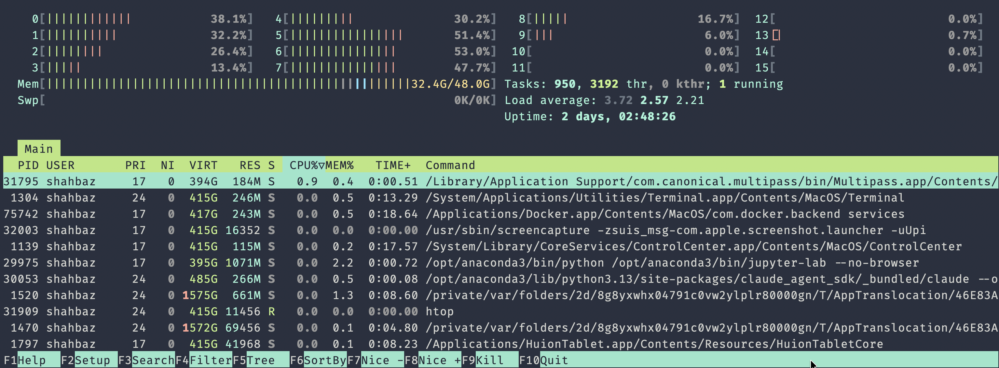


#### The **`ss -ltnp`** command will show you all processes which are listening for incoming network connections, along with the port number and the PID of the process
The **`ss`** command is fairly new but generally available on modern linux distributions. Here is an example showing a test web server running on port 8000 and `ss` showing its status:
```bash
(base) shahbaz@mleng:~$ python -m http.server &
[1] 477531
(base) shahbaz@mleng:~$ Serving HTTP on 0.0.0.0 port 8000 (http://0.0.0.0:8000/) ...

(base) shahbaz@mleng:~$ ss -tnpl
State          Recv-Q         Send-Q                   Local Address:Port                   Peer Address:Port         Process                                     
LISTEN         0              4096                     127.0.0.53%lo:53                          0.0.0.0:*                                                        
LISTEN         0              128                            0.0.0.0:9084                        0.0.0.0:*                                                        
LISTEN         0              4096                        127.0.0.54:53                          0.0.0.0:*                                                        
LISTEN         0              4096                           0.0.0.0:22                          0.0.0.0:*                                                        
LISTEN         0              2048                           0.0.0.0:8084                        0.0.0.0:*                                                        
LISTEN         0              5                              0.0.0.0:8000                        0.0.0.0:*             users:(("python",pid=477531,fd=3))         
LISTEN         0              128                               [::]:9084                           [::]:*                                                        
LISTEN         0              4096                              [::]:22                             [::]:*                                                        
```
(notice the use of `&` to send it to the background and the line showing local address port using port 8000)

#### The **`free`** command shows the amount of free and use memory on the computer

Output of `free -h`
```bash
               total        used        free      shared  buff/cache   available
Mem:           7.7Gi       420Mi       5.8Gi       1.2Mi       1.7Gi       7.3Gi
Swap:             0B          0B          0B
```

#### The **`df`** command shows the amount of free and used disk space on the computer

Output of `df -h`
```bash
Filesystem      Size  Used Avail Use% Mounted on
tmpfs           792M  1.2M  791M   1% /run
efivarfs        256K   15K  242K   6% /sys/firmware/efi/efivars
/dev/sda1        19G  4.3G   15G  23% /
tmpfs           3.9G     0  3.9G   0% /dev/shm
tmpfs           5.0M     0  5.0M   0% /run/lock
/dev/sda16      891M  113M  716M  14% /boot
/dev/sda15       98M  6.4M   92M   7% /boot/efi
tmpfs           792M   12K  792M   1% /run/user/1000
```
Note that this command may look complex, but generally you want to look at the "Mounted on" columna and look for `/` (the root directory). The `Size`, `Used`, `Avail` and `Use%` columns are the most important. 

### Summary:
  - `top` - displays all processes currently running in your terminal and updates in real-time
  - `htop` - a more user friendly version of `top`, which is not always installed by default
  - `free` - shows the amount of free and used memory on the computer
  - `df` - shows the amount of free and used disk space on the computer
  - `ss -ltnp` - show all processes which are listening for incoming network connections, along with the port number and the PID of the process